In [1]:
import loompy
import scanpy as sc
import pandas as pd
import seaborn as sns
import numpy as np
import scanpy as sc
import matplotlib.pyplot as plt
import glob
import bbknn

In [2]:
sc.settings.verbosity = 3
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80)

scanpy==1.6.0 anndata==0.7.5 umap==0.4.6 numpy==1.19.4 scipy==1.5.3 pandas==1.1.4 scikit-learn==0.23.2 statsmodels==0.12.1 python-igraph==0.8.3 louvain==0.7.0 leidenalg==0.8.2


In [3]:
E24Am = sc.read_loom('./E24Am.loom')
E24Is = sc.read_loom('./E24Is.loom')

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [4]:
E24Am.var_names_make_unique()
E24Is.var_names_make_unique()

In [5]:
E24AmIs = E24Am.concatenate(E24Is, batch_key='Region', batch_categories=['Ampulla','Isthmus'])

In [6]:
E24AmIs

AnnData object with n_obs × n_vars = 3864 × 31053
    obs: 'Clusters', '_X', '_Y', 'Region'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [7]:
E24AmIs.write('./E24AmIs.h5ad')

... storing 'Chromosome' as categorical
... storing 'Strand' as categorical


In [8]:
E24AmIs = sc.read('./E24AmIs.h5ad') 

In [9]:
E24AmIs

AnnData object with n_obs × n_vars = 3864 × 31053
    obs: 'Clusters', '_X', '_Y', 'Region'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

normalizing counts per cell
    finished (0:00:00)


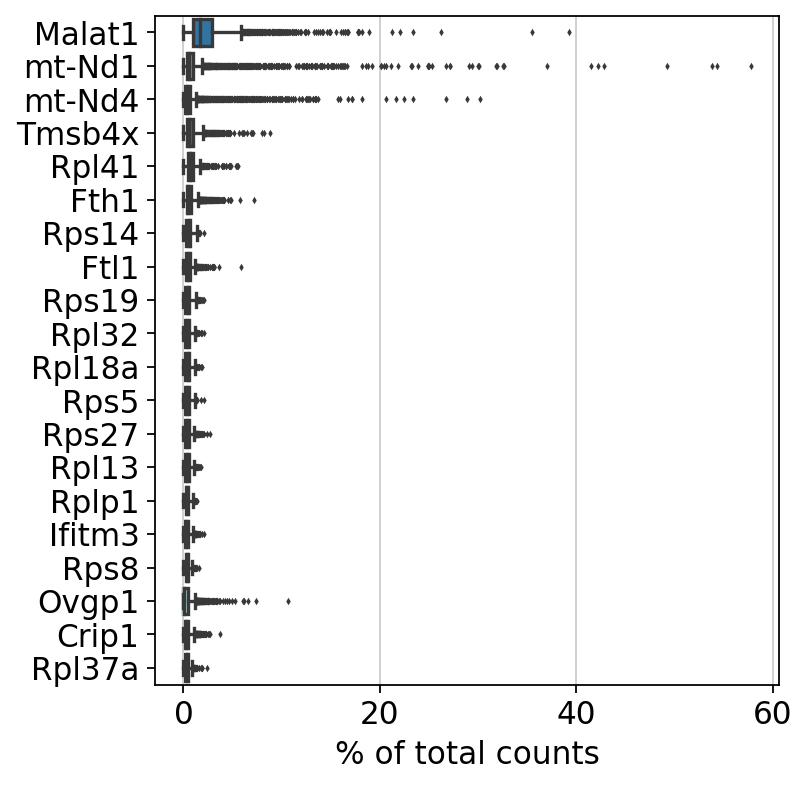

In [10]:
sc.pl.highest_expr_genes(E24AmIs, n_top=20)

In [11]:
sc.pp.filter_cells(E24AmIs, min_genes=200) 
sc.pp.filter_genes(E24AmIs, min_cells=3)

filtered out 78 cells that have less than 200 genes expressed
filtered out 14121 genes that are detected in less than 3 cells


In [12]:
mito_genes = E24AmIs.var_names.str.startswith('mt') 
E24AmIs.obs['percent_mito'] = np.sum(
    E24AmIs[:, mito_genes].X, axis=1).A1 / np.sum(E24AmIs.X, axis=1).A1 
E24AmIs.obs['n_counts'] = E24AmIs.X.sum(axis=1).A1 

/opt/conda/envs/hub_v2/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/opt/conda/envs/hub_v2/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


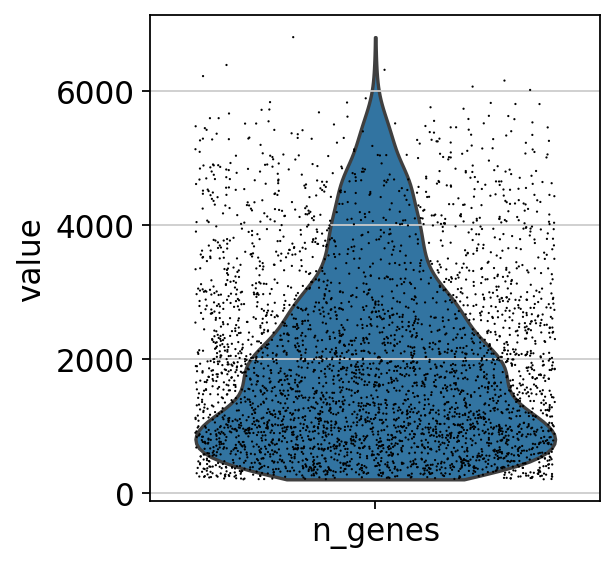

/opt/conda/envs/hub_v2/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/opt/conda/envs/hub_v2/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


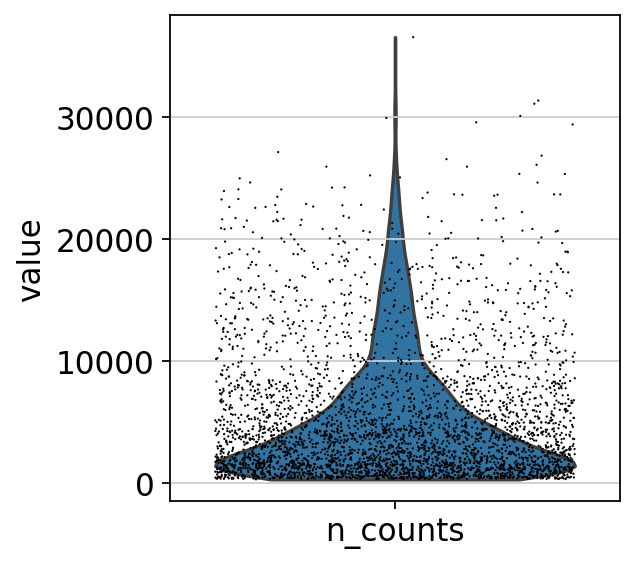

/opt/conda/envs/hub_v2/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/opt/conda/envs/hub_v2/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


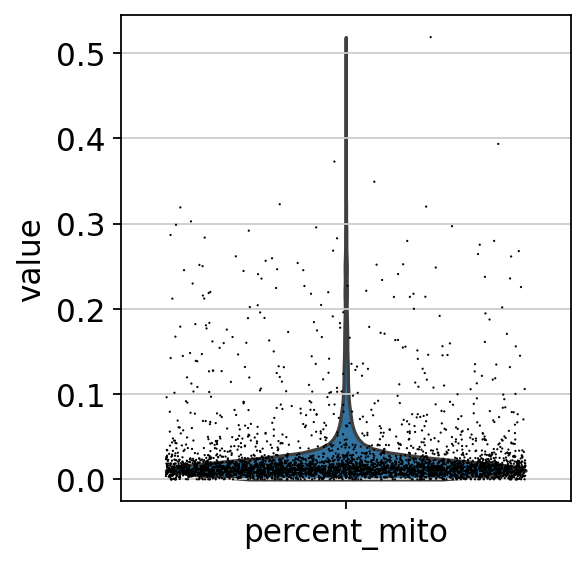

In [13]:
sc.pl.violin(E24AmIs, ['n_genes'], jitter=0.4)
sc.pl.violin(E24AmIs, ['n_counts'], jitter=0.4)
sc.pl.violin(E24AmIs, ['percent_mito'], jitter=0.4)

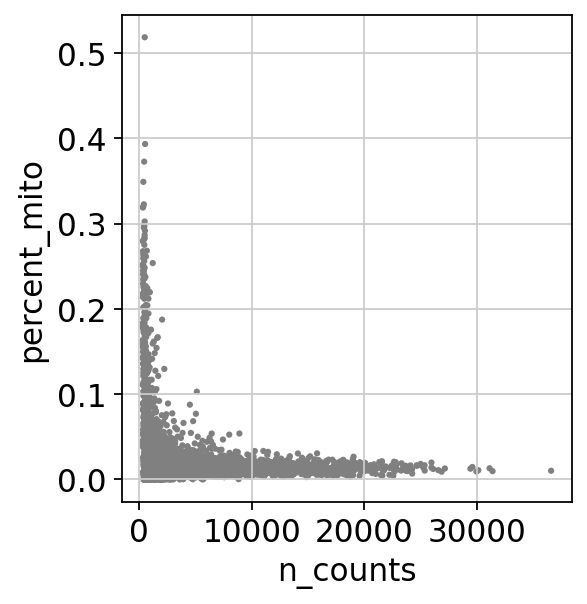

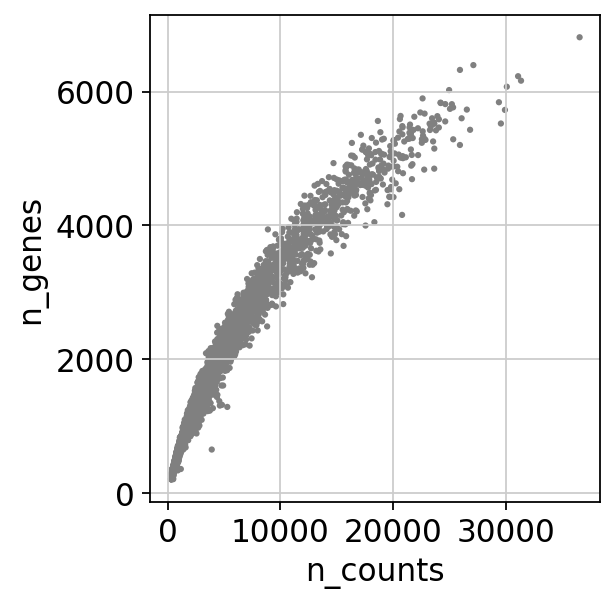

In [14]:
sc.pl.scatter(E24AmIs, x='n_counts', y='percent_mito')
sc.pl.scatter(E24AmIs, x='n_counts', y='n_genes')

In [15]:
E24AmIs = E24AmIs[E24AmIs.obs.n_genes < 6000, :]
E24AmIs = E24AmIs[E24AmIs.obs.percent_mito < 0.05, :]

In [16]:
sc.pp.normalize_total(E24AmIs, target_sum = None)

normalizing counts per cell
    finished (0:00:00)


/opt/conda/envs/hub_v2/lib/python3.7/site-packages/scanpy/preprocessing/_normalization.py:138: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [17]:
sc.pp.log1p(E24AmIs)

In [18]:
sc.pp.regress_out(E24AmIs, ['n_counts', 'percent_mito']) 

regressing out ['n_counts', 'percent_mito']
    sparse input is densified and may lead to high memory use
    finished (0:06:55)


In [19]:
sc.pp.highly_variable_genes(E24AmIs, n_top_genes=5000)

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


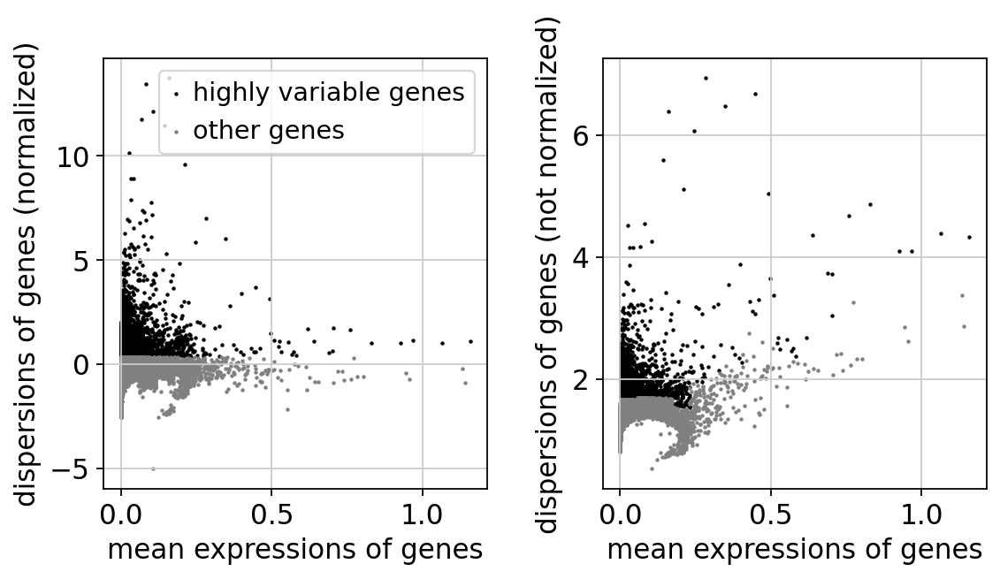

In [20]:
sc.pl.highly_variable_genes(E24AmIs)

In [21]:
sc.pp.scale(E24AmIs, max_value=10) 

In [22]:
sc.tl.pca(E24AmIs, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:01)


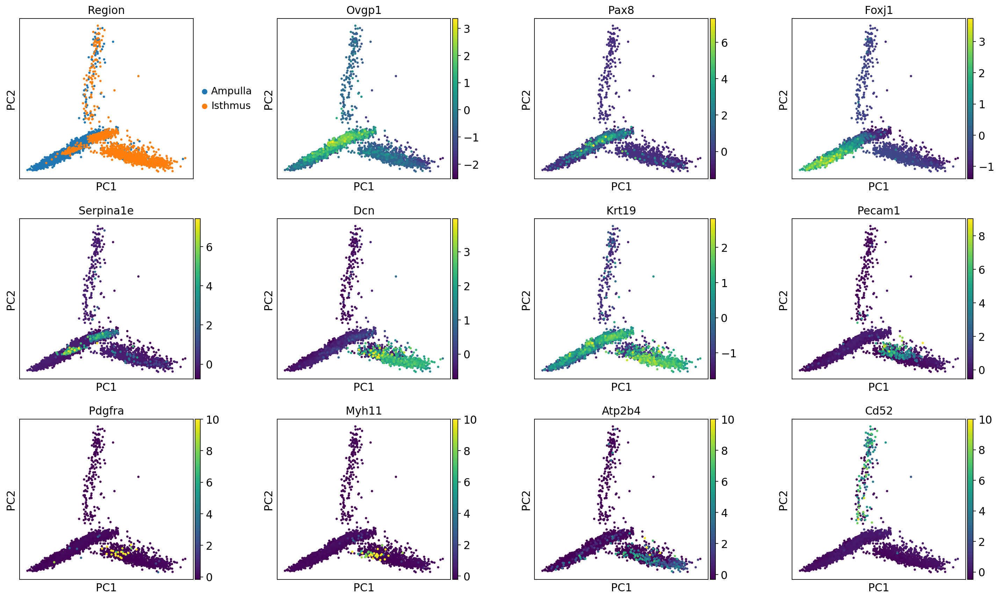

In [23]:
sc.pl.pca(E24AmIs, wspace=0.35,
          color=['Region', 'Ovgp1', 'Pax8','Foxj1',
                  'Serpina1e', 'Dcn', 'Krt19', 'Pecam1', 'Pdgfra', 'Myh11', 'Atp2b4', 'Cd52'])

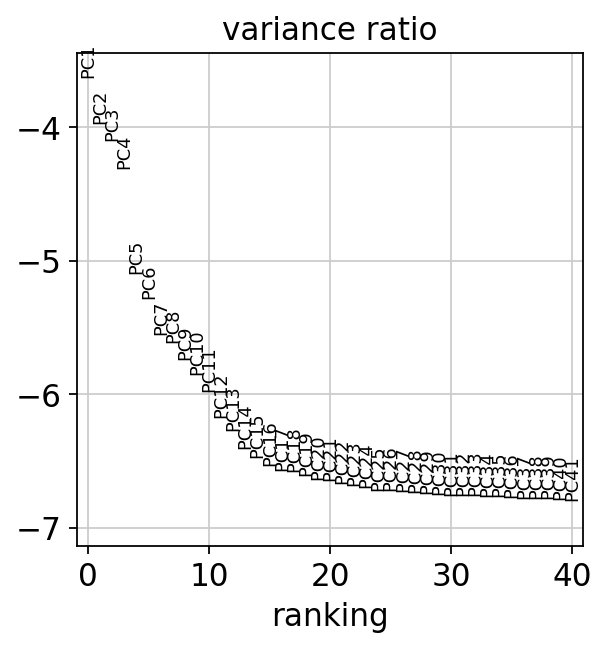

In [24]:
sc.pl.pca_variance_ratio(E24AmIs, n_pcs=40, log=True)

In [25]:
E24AmIs

AnnData object with n_obs × n_vars = 3431 × 16932
    obs: 'Clusters', '_X', '_Y', 'Region', 'n_genes', 'percent_mito', 'n_counts'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'Region_colors'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

In [26]:
sc.pp.neighbors(E24AmIs, n_neighbors=10, n_pcs=37)

computing neighbors
    using 'X_pca' with n_pcs = 37
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)


In [27]:
sc.tl.umap(E24AmIs)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:03)


In [28]:
sc.tl.leiden(E24AmIs, resolution=0.06) 

running Leiden clustering
    finished: found 10 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


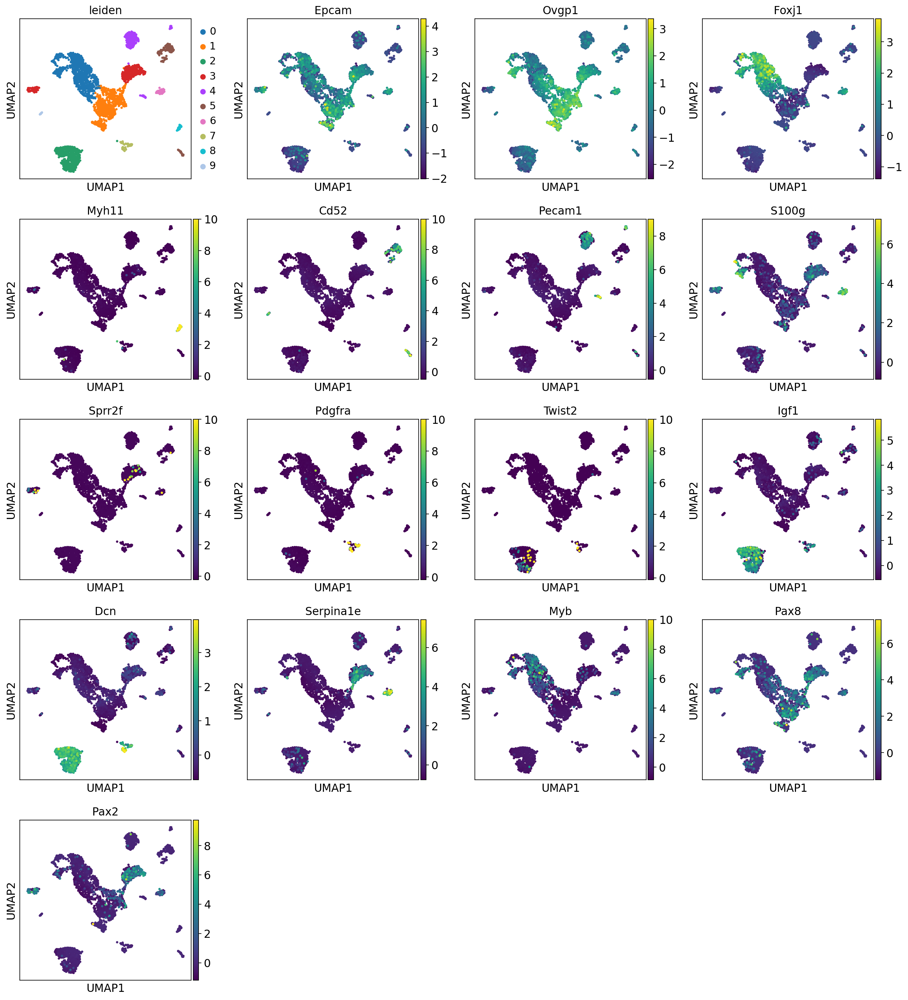

In [29]:
sc.pl.umap(E24AmIs,
           color=['leiden', 'Epcam', 'Ovgp1', 'Foxj1', 'Myh11', 'Cd52', 'Pecam1', 'S100g', 'Sprr2f',
                  
                  'Pdgfra', 'Twist2', 'Igf1', 'Dcn', 'Serpina1e', 'Myb', 'Pax8', 'Pax2'])

In [30]:
E24AmIs_subset = E24AmIs[E24AmIs.obs['leiden'].isin(
    ['0', '1', '2', '3', '6', '7', '8'])]

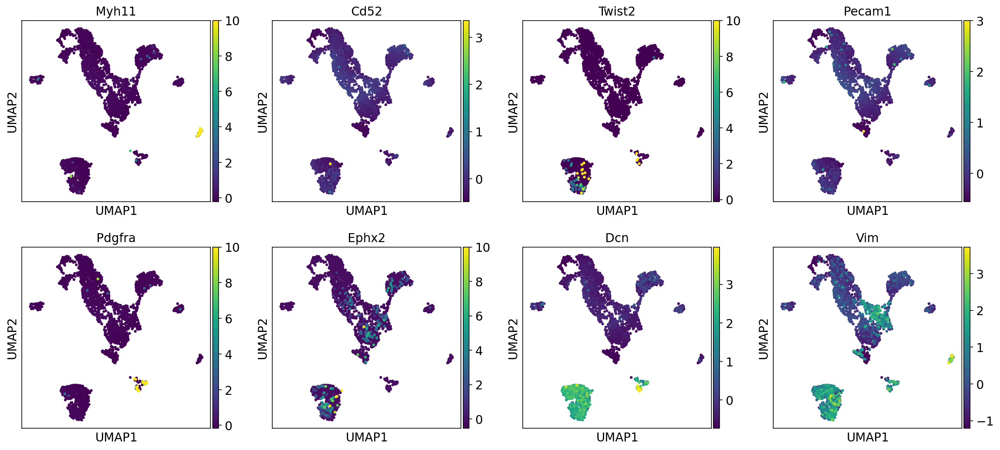

In [31]:
sc.pl.umap(E24AmIs_subset, 
           color=['Myh11', 'Cd52', 'Twist2', 'Pecam1',
                 'Pdgfra', 'Ephx2', 'Dcn', 'Vim'])

In [32]:
E24AmIs_subset

View of AnnData object with n_obs × n_vars = 2916 × 16932
    obs: 'Clusters', '_X', '_Y', 'Region', 'n_genes', 'percent_mito', 'n_counts', 'leiden'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'Region_colors', 'neighbors', 'umap', 'leiden', 'leiden_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'
    obsp: 'distances', 'connectivities'

In [33]:
E24AmIs_subset.write('./E24AmIs_subset.h5ad')

In [34]:
sc.tl.pca(E24AmIs_subset, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:03)


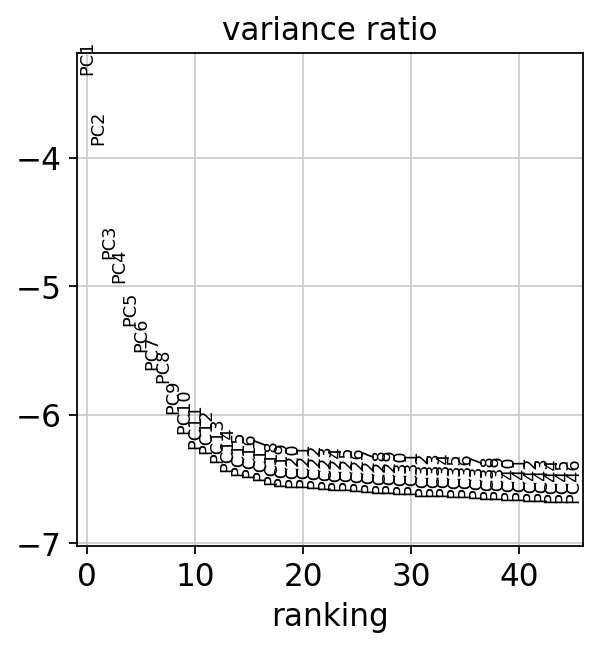

In [35]:
sc.pl.pca_variance_ratio(E24AmIs_subset, n_pcs=45, log=True)

In [36]:
sc.pp.neighbors(E24AmIs_subset, n_neighbors=10, n_pcs=37)

computing neighbors
    using 'X_pca' with n_pcs = 37
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


In [37]:
sc.tl.umap(E24AmIs_subset)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:02)


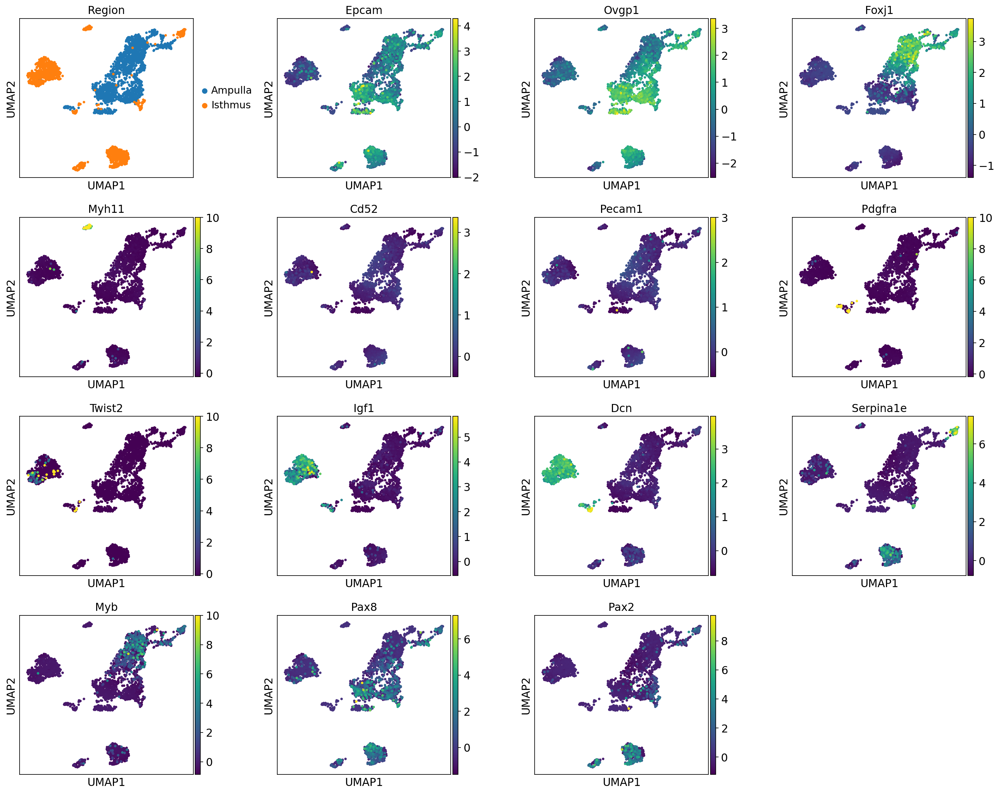

In [38]:
sc.pl.umap(E24AmIs_subset, wspace=0.35,
           color=['Region', 'Epcam', 'Ovgp1', 'Foxj1', 'Myh11', 'Cd52', 'Pecam1',
                  
                  'Pdgfra', 'Twist2', 'Igf1', 'Dcn', 'Serpina1e', 'Myb', 'Pax8', 'Pax2'])

In [39]:
sc.tl.leiden(E24AmIs_subset, resolution=0.08)

running Leiden clustering
    finished: found 7 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


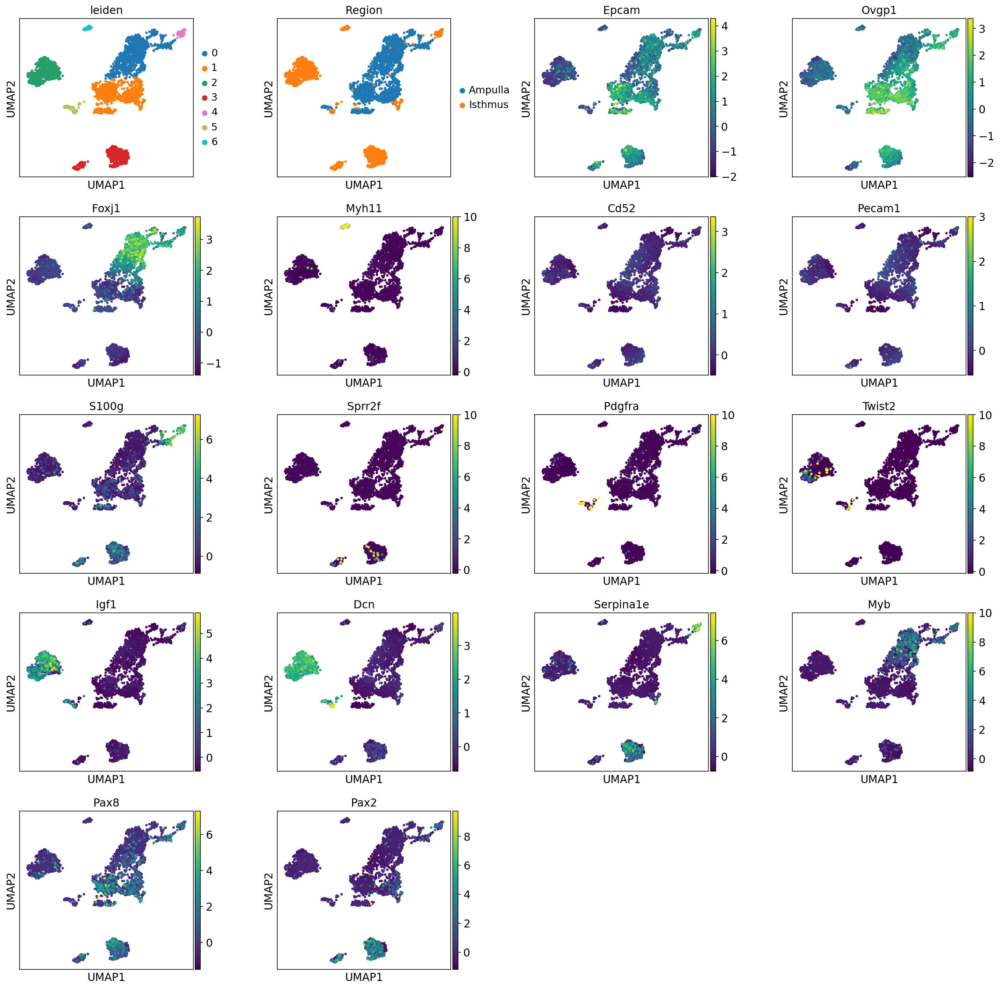

In [40]:
sc.pl.umap(E24AmIs_subset, wspace=0.35, 
           color=['leiden', 'Region', 'Epcam', 'Ovgp1', 'Foxj1', 'Myh11', 'Cd52', 'Pecam1', 'S100g', 'Sprr2f',
                  
                  'Pdgfra', 'Twist2', 'Igf1', 'Dcn', 'Serpina1e', 'Myb', 'Pax8', 'Pax2'])

In [41]:
E24AmIs_subset.write('./E24AmIs_subset.h5ad')

In [42]:
E24AmIs_subset_batchcorrected = bbknn.bbknn(E24AmIs_subset, batch_key='Region', copy=True)

computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
	`.obsp['distances']`, distances for each pair of neighbors
	`.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


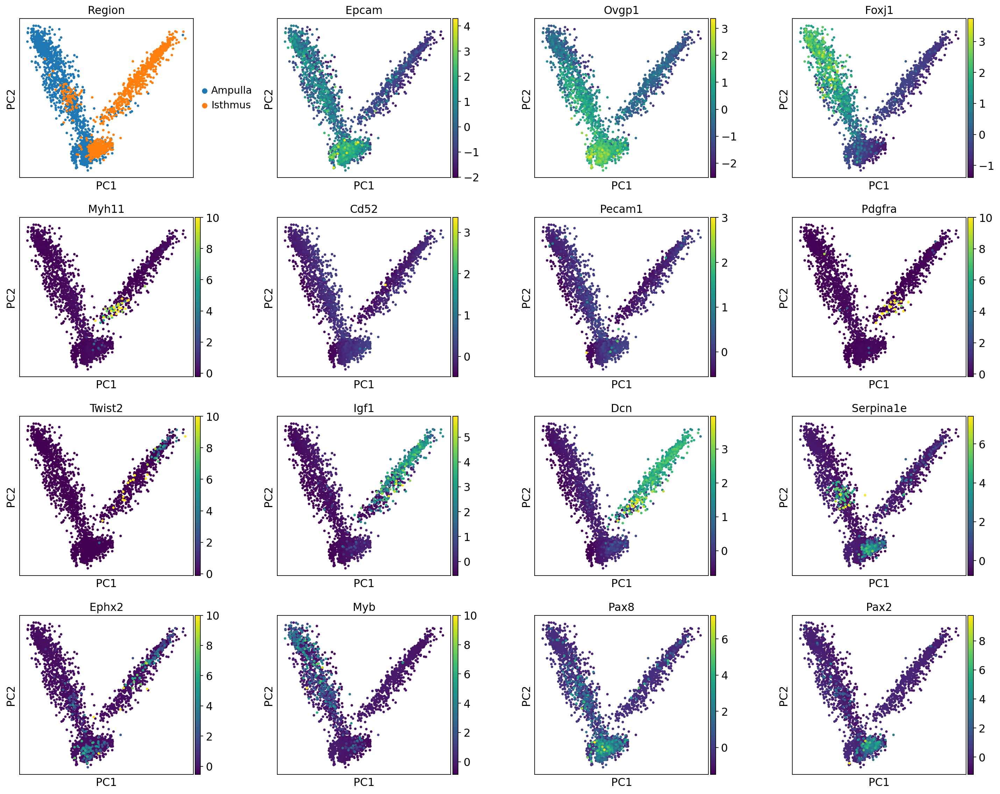

In [43]:
sc.pl.pca(E24AmIs_subset_batchcorrected, wspace=0.35,
          color=[ 'Region', 'Epcam', 'Ovgp1', 'Foxj1', 'Myh11', 'Cd52', 'Pecam1',
                  
                  'Pdgfra', 'Twist2', 'Igf1', 'Dcn', 'Serpina1e', 'Ephx2', 'Myb', 'Pax8', 'Pax2'])

In [44]:
sc.tl.umap(E24AmIs_subset_batchcorrected)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


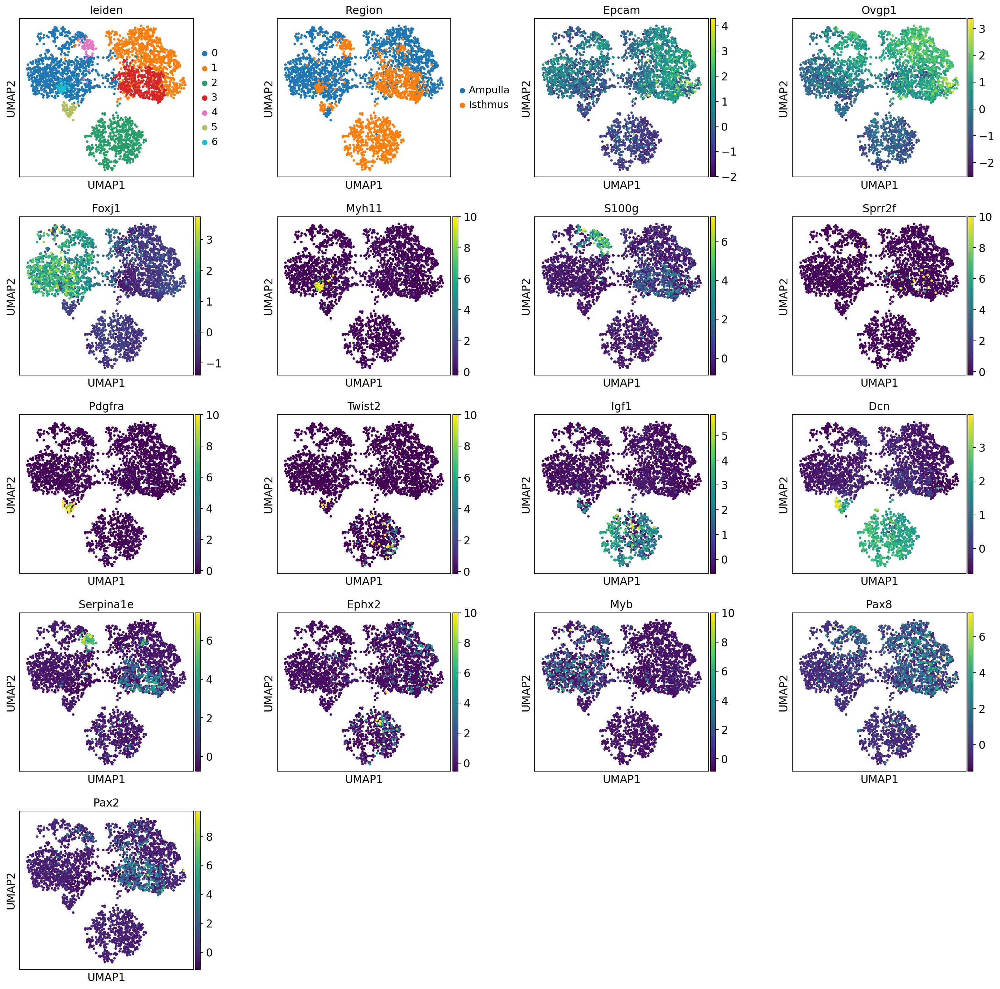

In [45]:
sc.pl.umap(E24AmIs_subset_batchcorrected, wspace=0.35, 
           color=['leiden', 'Region', 'Epcam', 'Ovgp1', 'Foxj1', 'Myh11', 'S100g', 'Sprr2f',
                  
                  'Pdgfra', 'Twist2', 'Igf1', 'Dcn', 'Serpina1e', 'Ephx2', 'Myb', 'Pax8', 'Pax2'], 
           save='_E24AmIs_subset_batchcorrected_leiden_markers.pdf')

In [46]:
marker_genes = ['Epcam', 'Krt15','Krt8','Krt19','Vim','Pdgfra','Twist2', 'Sprr2f',
                'Acta2', 'Myh11','Foxj1','Ovgp1','Wt1','Serpina1e','S100g','Pecam1',
                 ]

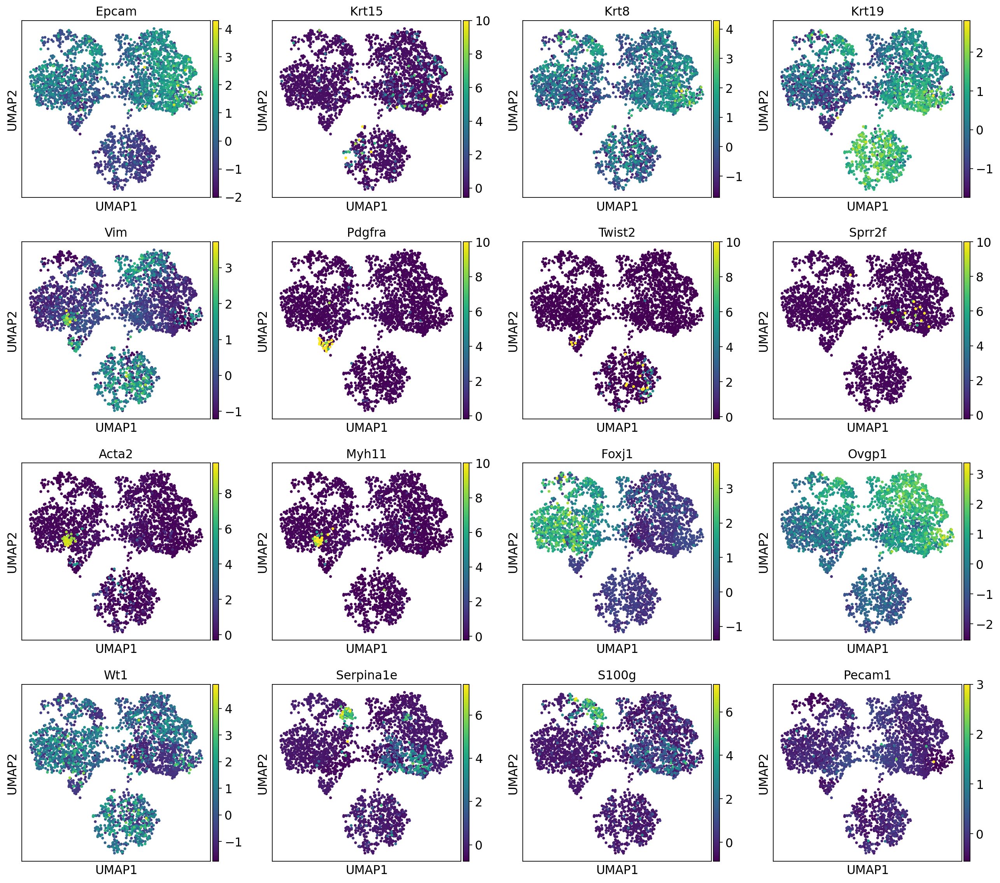

In [47]:
sc.pl.umap(E24AmIs_subset_batchcorrected, color=marker_genes)

In [48]:
new_cluster_names = [
    '0 Ciliated_InfAmp',
    '1 Secretory_InfAmp',
    '2 Fibroblast_Pdgfra-',
    '3 Secretory_IsthUTJ',
    '4 Epithelial_subset',
    '5 Fibroblast_Pdgfra+',
    '6 Muscle'
]
E24AmIs_subset_batchcorrected.rename_categories('leiden', new_cluster_names)

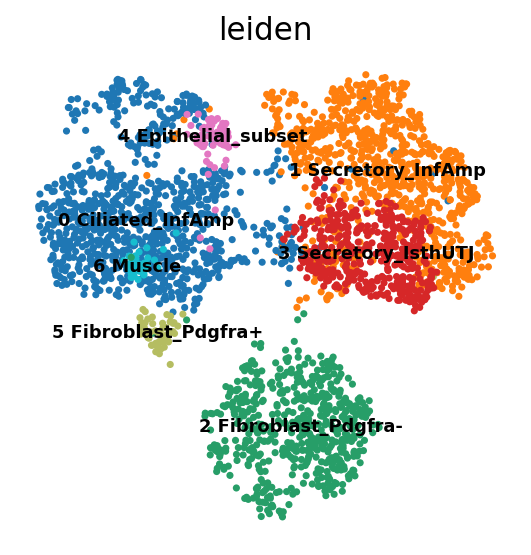

In [49]:
sc.pl.umap(E24AmIs_subset_batchcorrected, color='leiden', 
           legend_loc='on data', legend_fontsize='8.0',
           frameon=False)

In [50]:
E24AmIs_subset_batchcorrected.obs.groupby(["leiden","Region"]).apply(len)

leiden                Region 
0 Ciliated_InfAmp     Ampulla    951
                      Isthmus      6
1 Secretory_InfAmp    Ampulla    772
                      Isthmus     37
2 Fibroblast_Pdgfra-  Ampulla      9
                      Isthmus    561
3 Secretory_IsthUTJ   Isthmus    413
4 Epithelial_subset   Isthmus     67
5 Fibroblast_Pdgfra+  Ampulla     28
                      Isthmus     31
6 Muscle              Ampulla      3
                      Isthmus     38
dtype: int64

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns["dendrogram_['leiden']"]`


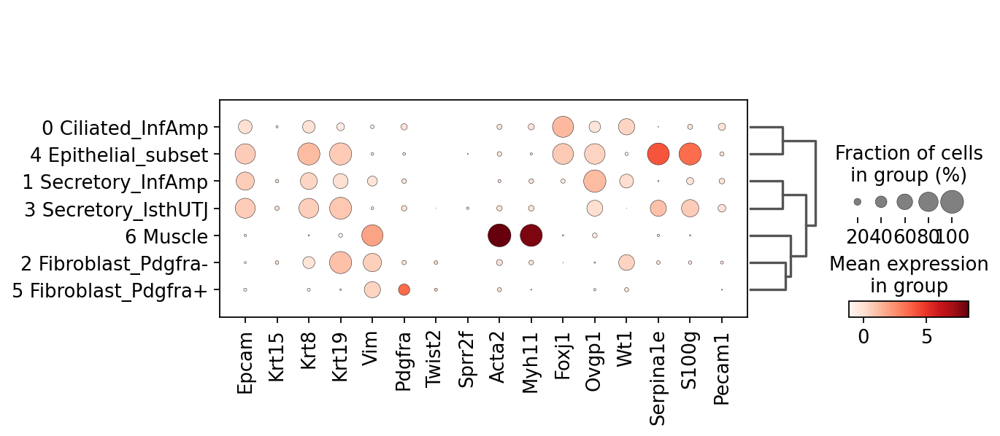

In [51]:
ax = sc.pl.dotplot(E24AmIs_subset_batchcorrected, 
                   marker_genes, groupby='leiden', dendrogram=True, 
                  save='_E24AmIs_subset_batchcorrected_dotplot_markergenes')

In [52]:
E24AmIs_subset_batchcorrected.obs['leiden_anno'] = E24AmIs_subset_batchcorrected.obs['leiden']
E24AmIs_subset_batchcorrected.obs['leiden_anno'].cat.categories = [
    '0 Ciliated_InfAmp', '1 Secretory_InfAmp', 
 '2 Fibroblast_Pdgfra-', '3 Secretory_IsthUTJ', 
    '4 Epithelial_subset', '5 Fibroblast_Pdgfra+',                                                                
'6 Muscle']

In [53]:
E24AmIs_subset_batchcorrected.write('./E24AmIs_subset_batchcorrected_analyzed.h5ad')